## Olympic Data Analysis
This is a Olympic historical dataset on the modern Olympic Games

In [1]:
#import basic libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import cufflinks as cf
import plotly.express as px
cf.go_offline()
%matplotlib inline

In [2]:
#Importing dataset and saved in varible df
df = pd.read_csv("athlete_events.csv")

In [3]:
df.head(3)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN


In [4]:
df.tail(3)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
271113,135570,Piotr ya,M,27.0,176.0,59.0,Poland,POL,2014 Winter,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Team",NaN
271114,135571,Tomasz Ireneusz ya,M,30.0,185.0,96.0,Poland,POL,1998 Winter,1998,Winter,Nagano,Bobsleigh,Bobsleigh Men's Four,NaN
271115,135571,Tomasz Ireneusz ya,M,34.0,185.0,96.0,Poland,POL,2002 Winter,2002,Winter,Salt Lake City,Bobsleigh,Bobsleigh Men's Four,NaN


In our dataset we have following columns:

ID - Unique number for each athlete ;
Name - Athlete's name ;
Sex - M or F ;
Age - Integer ;
Height - In centimeters ;
Weight - In kilograms ;
Team - Team name ;
NOC - National Olympic Committee 3-letter code ;
Games - Year and season ;
Year - Integer ;
Season - Summer or Winter ;
City - Host city;
Sport - Sport Name ;
Event - Event ;
Medal - Gold, Silver, Bronze, or NA

In [5]:
df.dtypes

ID          int64
Name       object
Sex        object
Age       float64
Height    float64
Weight    float64
Team       object
NOC        object
Games      object
Year        int64
Season     object
City       object
Sport      object
Event      object
Medal      object
dtype: object

In [6]:
df.shape

(271116, 15)

In [7]:
print("Numbers of Rows: ", df.shape[0])
print("Numbers of columns: ", df.shape[1])

Numbers of Rows:  271116
Numbers of columns:  15


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271116 entries, 0 to 271115
Data columns (total 15 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   ID      271116 non-null  int64  
 1   Name    271116 non-null  object 
 2   Sex     271116 non-null  object 
 3   Age     261642 non-null  float64
 4   Height  210945 non-null  float64
 5   Weight  208241 non-null  float64
 6   Team    271116 non-null  object 
 7   NOC     271116 non-null  object 
 8   Games   271116 non-null  object 
 9   Year    271116 non-null  int64  
 10  Season  271116 non-null  object 
 11  City    271116 non-null  object 
 12  Sport   271116 non-null  object 
 13  Event   271116 non-null  object 
 14  Medal   39783 non-null   object 
dtypes: float64(3), int64(2), object(10)
memory usage: 31.0+ MB


In [9]:
# In dataset we need to check null values
df.isnull()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
2,False,False,False,False,True,True,False,False,False,False,False,False,False,False,True
3,False,False,False,False,True,True,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271111,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
271112,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
271113,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
271114,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True


In [10]:
df.isnull().sum()

ID             0
Name           0
Sex            0
Age         9474
Height     60171
Weight     62875
Team           0
NOC            0
Games          0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal     231333
dtype: int64

In [11]:
#Replacing null values with mean of recpective coloumn
df["Age"].fillna((df["Age"].mean()), inplace = True)
df["Height"].fillna((df['Height'].mean()),inplace = True)
df["Weight"].fillna((df["Weight"].mean()),inplace = True)

In [12]:
#Replacing null values with "No Medal"
df["Medal"].fillna("No Medal", inplace = True)

In [13]:
# There are no null values present
df.isnull().sum()

ID        0
Name      0
Sex       0
Age       0
Height    0
Weight    0
Team      0
NOC       0
Games     0
Year      0
Season    0
City      0
Sport     0
Event     0
Medal     0
dtype: int64

In [14]:
df.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.00000,80.000000,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,No Medal
1,2,A Lamusi,M,23.0,170.00000,60.000000,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,No Medal
2,3,Gunnar Nielsen Aaby,M,24.0,175.33897,70.702393,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,No Medal
3,4,Edgar Lindenau Aabye,M,34.0,175.33897,70.702393,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.00000,82.000000,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,No Medal


 Cities that hosted the Olympics with respect to the years and the number of times they hosted the Olympics


In [15]:
# Grouping by city and aggregating the years they hosted the games
host_cities = df.groupby('City')['Year'].agg(lambda x: sorted(list(set(x)))).reset_index()
host_cities ['Times_Hosted'] = host_cities ['Year'].apply(len)
host_cities  = host_cities .sort_values(by=['Times_Hosted'], ascending=[False]).reset_index(drop=True)

host_cities .head(10)


,City,Year,Times_Hosted
0,Athina,"[1896, 1906, 2004]",3
1,London,"[1908, 1948, 2012]",3
2,Sankt Moritz,"[1928, 1948]",2
3,Paris,"[1900, 1924]",2
4,Stockholm,"[1912, 1956]",2
5,Los Angeles,"[1932, 1984]",2
6,Lake Placid,"[1932, 1980]",2
7,Innsbruck,"[1964, 1976]",2
8,Albertville,[1992],1
9,Rio de Janeiro,[2016],1


In [16]:
#Participation of men and women in Olympic games
df.columns

Index(['ID', 'Name', 'Sex', 'Age', 'Height', 'Weight', 'Team', 'NOC', 'Games',
       'Year', 'Season', 'City', 'Sport', 'Event', 'Medal'],
      dtype='object')

In [26]:
# Calculate and print the total number of athletes who participated in the Olympics
print("Total no of Athletes who participated in Olympics : ", df['ID'].count())

# Calculate and print the total number of Female athletes who participated in the Olympics
print("Total no of Female who participated in Olympics : ", (df['Sex']=='F').sum())

# Calculate and print the total number of Male athletes who participated in the Olympics
print("Total no of Male who participated in Olympics : ", (df['Sex']=='M').sum())

Total no of Athletes who participated in Olympics :  271116
Total no of Female who participated in Olympics :  74522
Total no of Male who participated in Olympics :  196594


C:\Users\AKRITI SINGH\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\AKRITI SINGH\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\AKRITI SINGH\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\AKRITI SINGH\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\AKRITI SINGH\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and w

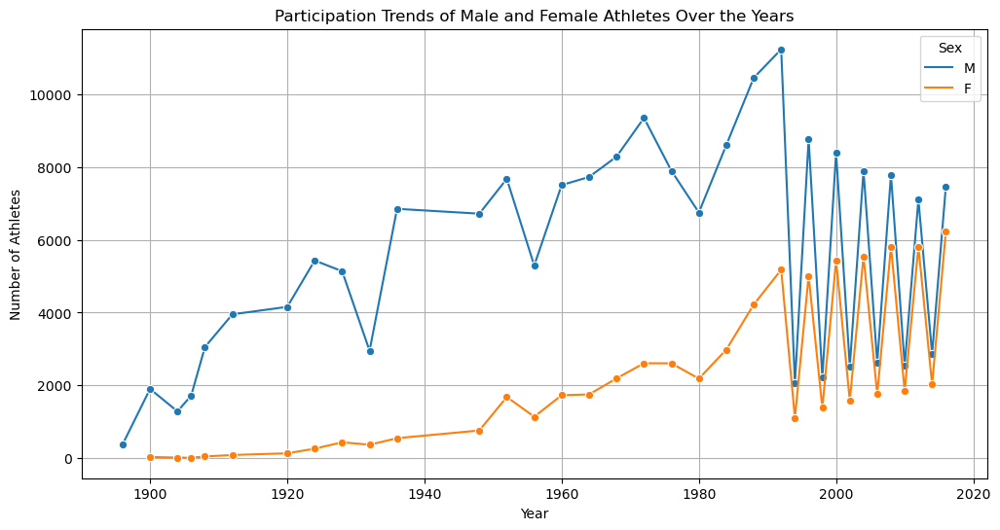

In [33]:
# Analyzing participation trends of male and female athletes over the years


participation_trends = df.groupby(['Year', 'Sex']).size().reset_index(name='Count')

plt.figure(figsize=(12, 6))

sns.lineplot(x='Year', y='Count', hue='Sex', data=participation_trends, marker='o')
plt.title('Participation Trends of Male and Female Athletes Over the Years')
plt.xlabel('Year')
plt.ylabel('Number of Athletes')
plt.grid(True)

plt.show()


In [18]:
# Considering data from Summer Olympics 

df_summer = df[df['Season'] =="Summer"] 
df_summer.head(3)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.00000,80.000000,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,No Medal
1,2,A Lamusi,M,23.0,170.00000,60.000000,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,No Medal
2,3,Gunnar Nielsen Aaby,M,24.0,175.33897,70.702393,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,No Medal


In [19]:
# Considering data from Winter Olympics 
df_winter = df[df['Season'] =="Winter"]
df_winter.head(3)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,No Medal
5,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,"Speed Skating Women's 1,000 metres",No Medal
6,5,Christine Jacoba Aaftink,F,25.0,185.0,82.0,Netherlands,NED,1992 Winter,1992,Winter,Albertville,Speed Skating,Speed Skating Women's 500 metres,No Medal


In [20]:
#Creating a Summer Olympics dataset- Aggregate the number of occurrences by 'Sex' and 'Year

trend = df_summer.groupby(['Sex','Year']).size().reset_index().pivot(columns = 'Sex', index = 'Year',values = 0).reset_index()
trend.head(2)

Sex,Year,F,M
0,1896,NaN,380.0
1,1900,33.0,1903.0


In [21]:
# Create a line chart to visualize the participation trends of male and female athletes over the years in the Summer Olympics.

fig = px.line(trend, x='Year', y=['M', 'F'], 
              labels={'value': 'Number of Participants', 'variable': 'Sex'},
              title='Participation of Male and Female Athletes Over the Years (Summer Olympics)')

fig.update_layout(
    yaxis=dict(tickmode='linear', tick0=0, dtick=1000),
    xaxis=dict(tickmode='linear', dtick=10))

fig.show()

##Conclusion:

Over the years this is observed that number of female athletes increase in Olympics

In [22]:
#Creating a Winter Olympics dataset- Aggregate the number of occurrences by 'Sex' and 'Year
trend_winter = df_winter.groupby(['Sex','Year']).size().reset_index().pivot(columns = 'Sex', index = 'Year',values = 0).reset_index()
trend_winter.head()

Sex,Year,F,M
0,1924,17,443
1,1928,33,549
2,1932,22,330
3,1936,81,814
4,1948,133,942


In [23]:
# Create a line chart to visualize the participation trends of male and female athletes over the years in the Winter Olympics.

fig = px.line(trend_winter, x='Year', y=['M', 'F'], 
              labels={'value': 'Number of Participants', 'variable': 'Sex'},
              title='Participation of Male and Female Athletes Over the Years (Winter Olympics)')

fig.update_layout(
    yaxis=dict(tickmode='linear', tick0=0, dtick=1000),
    xaxis=dict(tickmode='linear', dtick=10))

fig.show()

In [24]:
# Creating a grouped histogram to visualize the total number of male and female participants in the Summer and Winter Olympics.
# The bars are color-coded by gender: blue for males and orange for females. 
fig = px.histogram(df, x='Season', color='Sex', barmode = "group", color_discrete_map= {'M' : "Blue", "F" : "Orange"})
fig.update_layout(             
             title='Total Number of Male and Female Participants in Summer and Winter Olympics', yaxis_title = "Number of Athletes Participated")

fig.show()

##The visualizations show the following insights:

Participation Trends of Male and Female Athletes Over the Years:

*Male participation has consistently been higher than female participation throughout the history of the Olympics.

*There was a significant increase in male participation around the mid-20th century.

*Female participation started much lower but has shown a steady and significant increase over the years.

*The gap between male and female participation has been narrowing, especially from the 1980s onward, reflecting greater inclusion and opportunities for women in sports.

*The trend in recent years shows near parity between male and female participation, indicating a major shift towards gender equality in the Olympics.

#Conclusion:
The trends highlight the historical dominance of male athletes in the Olympics, but also the significant progress in female participation over time. 
This reflects broader social changes and efforts by the Olympic committees to promote gender equality in sports.

C:\Users\AKRITI SINGH\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\AKRITI SINGH\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



Text(0.5, 1.0, 'Age Distribution')

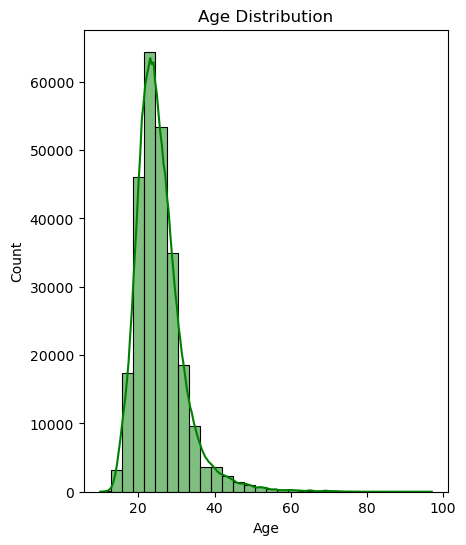

In [39]:
# Create a distribution plot for the 'Age' column
plt.figure(figsize=(16, 6))

plt.subplot(1, 3, 1)
sns.histplot(df['Age'], bins=30,color = 'Green', kde=True)
plt.title('Age Distribution')


C:\Users\AKRITI SINGH\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\AKRITI SINGH\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



Text(0.5, 1.0, 'Height Distribution')

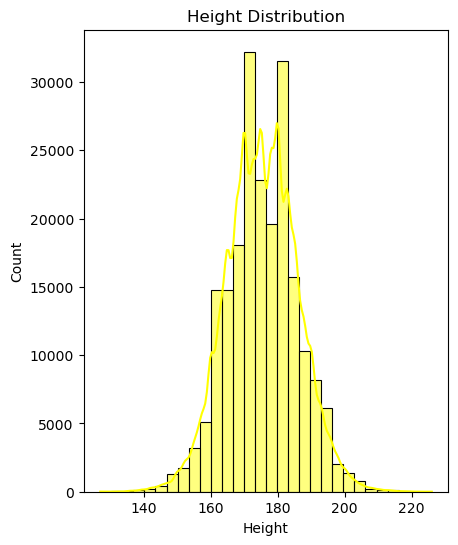

In [44]:
# Create a distribution plot for the 'Height' column
plt.figure(figsize=(16, 6))

plt.subplot(1, 3, 1)
sns.histplot(df['Height'], bins=30,color = 'Yellow', kde=True)
plt.title('Height Distribution')

C:\Users\AKRITI SINGH\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\AKRITI SINGH\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



Text(0.5, 1.0, 'Weight Distribution')

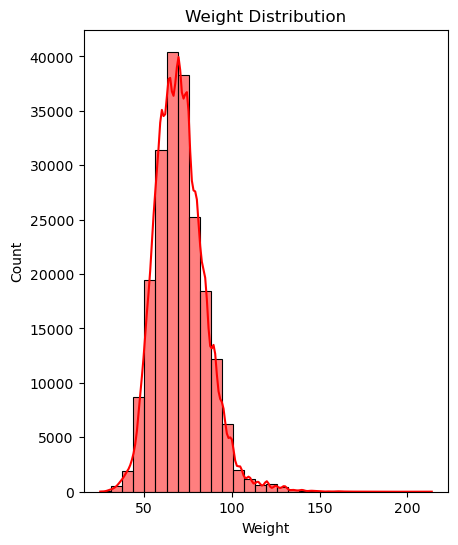

In [43]:
# Create a distribution plot for the 'Weight' column
plt.figure(figsize=(16, 6))

plt.subplot(1, 3, 1)
sns.histplot(df['Weight'], bins=30,color = 'Red', kde=True)
plt.title('Weight Distribution')

The visualizations show the following insights:

Age Distribution: The age distribution is slightly right-skewed, with most athletes between 20 and 30 years old. There are a few outliers with ages as high as 97.

Height Distribution: The height distribution is approximately normal, with a mean around 175 cm. Some outliers exist on both ends.

Weight Distribution: The weight distribution is also approximately normal, with most athletes weighing between 60 and 80 kg.

Conclusion: The visualizations of age, height, and weight distributions provide a comprehensive overview of the physical characteristics of Olympic athletes. The findings suggest that while most athletes fall within a certain age, height, and weight range, reflecting the general demands of competitive sports, there is significant variation that corresponds to the diverse requirements of different sports disciplines.

C:\Users\AKRITI SINGH\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\AKRITI SINGH\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



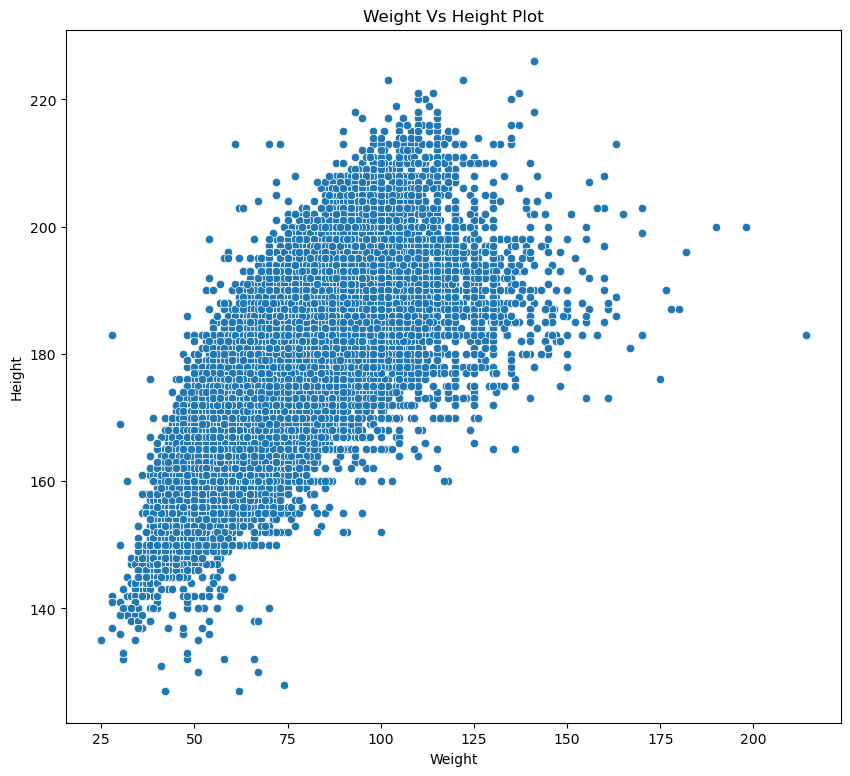

In [53]:
# Create a scatter plot to visualize the relationship between Weight and Height
plt.figure(figsize = (10,9))
sns.scatterplot(x='Weight', y='Height', data=df)
plt.title("Weight Vs Height Plot")
plt.xlabel('Weight')
plt.ylabel('Height')
plt.show()

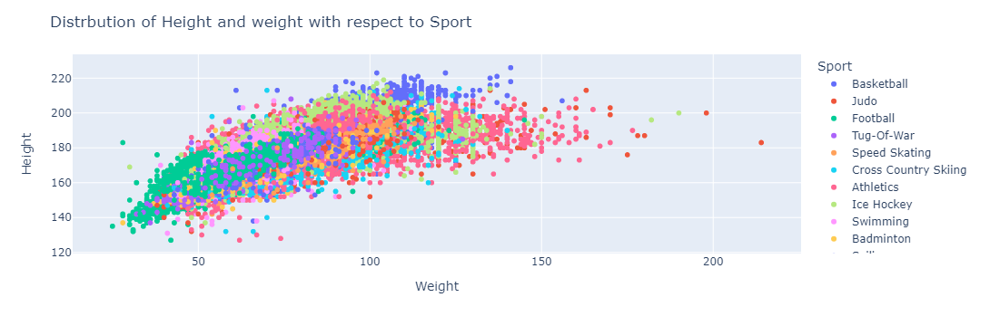

<Figure size 1000x900 with 0 Axes>

In [55]:
# Create a scatter plot to visualize the distribution of height and weight across different sports
# The points are colored based on the 'Sport' category for easy differentiation

fig = px.scatter(df, x ='Weight', y = 'Height', color = 'Sport')

fig.update_layout(title = "Distrbution of Height and weight with respect to Sport")

##The visualizations show the following insights:

The scatter plot Weight vs. Height shows a positive correlation between weight and height, indicating that, generally, taller athletes tend to weigh more. This is consistent with expectations since body mass typically increases with height showing the diversity of body types among athletes. Outliers are present where athletes are either very tall and light or short and heavy, which could correspond to specific sports requirements.
Distribution Across Sports:

Distribution of weight and height across Sports shows how height and weight distributions vary across different sports. Typically, certain sports like basketball and volleyball feature taller athletes, while sports like gymnastics tend to have shorter, lighter athletes.

This visualization would likely show clusters where certain sports dominate specific regions of the weight-height spectrum. For example, weightlifters might cluster at higher weights, while endurance runners might cluster at lower weights.

#Conclusion:
The relationship between weight and height is strong and positive among Olympic athletes, but the diversity in these physical attributes highlights the specialization required in different sports. The distribution across sports further emphasizes that specific physical characteristics are necessary in certain disciplines. Understanding these relationships can provide valuable insights into how athletes are selected and trained for specific sports, as well as how they optimize their physical attributes for peak performance.

In [45]:
#Importing another dataset and saved in varible df_noc
df_noc = pd.read_csv("noc_regions.csv")

In [46]:
df_noc.head()

,NOC,region,notes
0,AFG,Afghanistan,NaN
1,AHO,Curacao,Netherlands Antilles
2,ALB,Albania,NaN
3,ALG,Algeria,NaN
4,AND,Andorra,NaN


In [47]:
# Merging the main dataframe (df) with the NOC dataframe (df_noc) on the 'NOC' column using a left join to include all rows from df and matching rows from df_noc
data = pd.merge(df,df_noc,on = "NOC", how = 'left')
data.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,NaN
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands,NaN


C:\Users\AKRITI SINGH\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\AKRITI SINGH\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\AKRITI SINGH\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



Text(0, 0.5, 'Number of Medals')

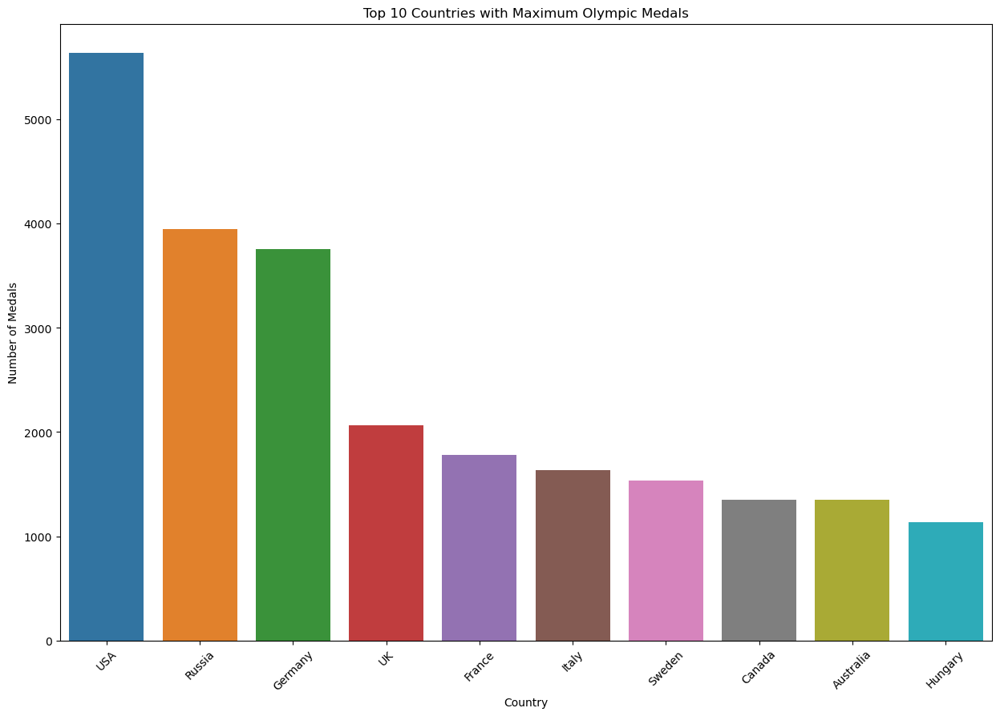

In [48]:
#Creating a bar plot to visualize the top 10 countries with the maximum number of Olympic medals.
# The data is grouped by region, counting the number of medals, and the top 10 regions are selected.
# The x-axis represents the country, with the labels rotated for clarity, and the y-axis shows the number of medals.

plt.figure(figsize = (15,10))
top_c = data.groupby('region')['Medal'].count().nlargest(10).reset_index()
sns.barplot(x = 'region', y ='Medal', data = top_c)
plt.title('Top 10 Countries with Maximum Olympic Medals')
plt.xlabel('Country')
plt.xticks(rotation=45)
plt.ylabel('Number of Medals')

##The visualizations show the following insights:

The USA, Russia, Germany leads significantly in the number of Olympic medals won, indicating consistent top performance across multiple Olympic Games and sports categories.

Other nations like Great Britain, France, and Italy are also among the top 10, reflecting their longstanding participation and success in the Olympics.

China relatively newer entrant to the top ranks, shows rapid progress

#Conclusion:
The data indicates that a few countries have historically dominated the Olympics, with the United States being the most successful, followed by the Russia and various forms of Germany. These countries have leveraged strong sports programs, infrastructure to achieve consistent success. Meanwhile, China's rise in recent years highlights how newer players can emerge as Olympic powerhouses with targeted efforts. 

In [61]:
# Filter the dataset to include only entries from the 'India' region
India = data[(data['NOC'] == 'IND')]
India.head(3)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
505,281,S. Abdul Hamid,M,NaN,NaN,NaN,India,IND,1928 Summer,1928,Summer,Amsterdam,Athletics,Athletics Men's 110 metres Hurdles,NaN,India,NaN
506,281,S. Abdul Hamid,M,NaN,NaN,NaN,India,IND,1928 Summer,1928,Summer,Amsterdam,Athletics,Athletics Men's 400 metres Hurdles,NaN,India,NaN
895,512,Shiny Kurisingal Abraham-Wilson,F,19.0,167.0,53.0,India,IND,1984 Summer,1984,Summer,Los Angeles,Athletics,Athletics Women's 800 metres,NaN,India,NaN


In [64]:
#Counting the number of each type of medal won by India and store the results in the 'Medals' variable
Medal_Type = India['Medal'].value_counts().reset_index()
Medal_Type.columns = ['Medal_Type', 'Count']
Medal_Type

,Medal_Type,Count
0,Gold,138
1,Bronze,40
2,Silver,19


C:\Users\AKRITI SINGH\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\AKRITI SINGH\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\AKRITI SINGH\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



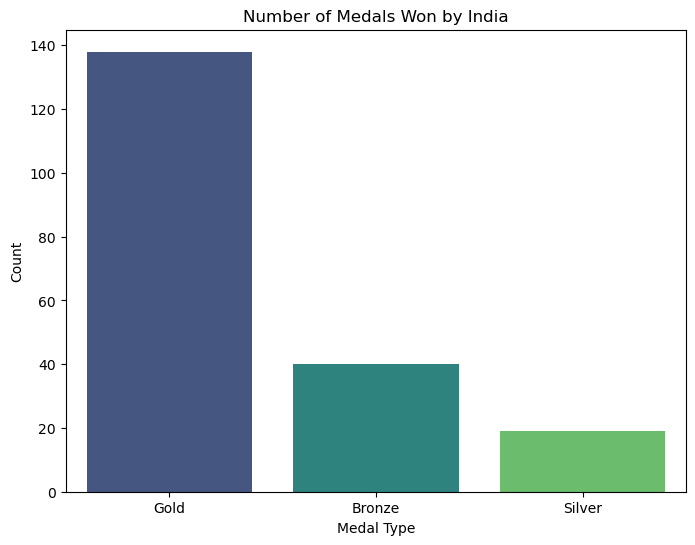

In [65]:
# Plotting the medal counts
plt.figure(figsize=(8, 6))
sns.barplot(x='Medal_Type', y='Count', data=Medal_Type, palette='viridis')
plt.title('Number of Medals Won by India')
plt.xlabel('Medal Type')
plt.ylabel('Count')
plt.show()


##The visualizations show the following insights:

The bar plot shows that India has won more gold medals than silver or bronze. This indicates that when Indian athletes have reached the podium, they have been able to secure the top position more often than the other two.

#Conclusion:
India's Olympic performance shows that when athletes reach the podium, they often achieve the highest honor, winning gold medals more frequently than silver or bronze. This suggests that while the total medal count may not be very high, Indian athletes who do excel in their events often reach the pinnacle of success. Continued investment in sports could help increase the overall medal count, ensuring that Indian athletes consistently reach and perform on the international stage.

In [ ]:
df.head(3)

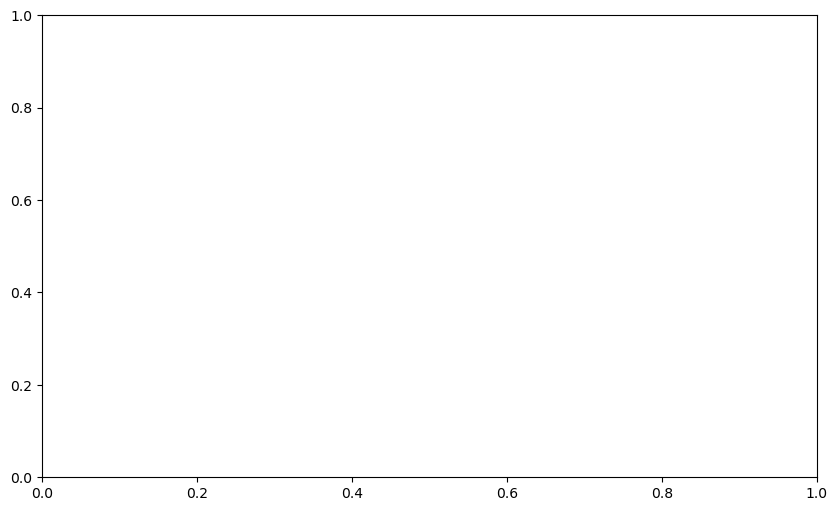

In [66]:
from matplotlib.animation import FuncAnimation

# Ensure matplotlib is configured to use pillow for saving GIFs
from matplotlib import rcParams
rcParams['animation.convert_path'] = 'pillow'

# Load the dataset
file_path = 'athlete_events.csv'
df = pd.read_csv(file_path)

# Filter out rows with NaN medals and create a year-country-medal DataFrame
medals = df.dropna(subset=['Medal'])
year_country_medal = medals.groupby(['Year', 'NOC']).size().unstack(fill_value=0)

# Prepare data for animation
years = year_country_medal.index
countries = year_country_medal.columns

fig, ax = plt.subplots(figsize=(10, 6))

def update(year):
    ax.clear()
    data_for_year = year_country_medal.loc[year].sort_values(ascending=False).head(10)
    ax.barh(data_for_year.index, data_for_year.values, color='skyblue')
    ax.set_title(f'Top 10 Countries by Medal Count in {year}')
    ax.set_xlabel('Medal Count')
    ax.set_ylabel('Country')
    ax.invert_yaxis()  # Highest values at the top

ani = FuncAnimation(fig, update, frames=years, interval=500, repeat=False)
plt.show()

# Save the animation as GIF using Pillow
ani.save('top_countries_medal_count.gif', writer='pillow')

##Conclusion